# Исследование данных заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Нам доступен датасет c заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

Исследование пройдет в 5 этапов:

1. Обзор данных.
2. Предобработка данных.
3. Исследовательский анализ данных.
4. Исследование по открытию кофейни.
5. Анализ результатов.
6. Подготовка презентации.

 ### Обзор данных


In [1]:
import pandas as pd
import scipy.stats as st
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import sys
from plotly import graph_objects as go
from os.path import join
import warnings
warnings.filterwarnings("ignore")
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import json

In [2]:
try:
    msk_places = pd.read_csv('/datasets/moscow_places.csv')
except:
    msk_places = pd.read_csv(r'C:\Users\asus\Downloads\moscow_places.csv')
    
display(msk_places.head())
msk_places.info()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В датасете представлено 8406 заведений. Столбцы name, category, address, district, hours, lat, price, avg_bill хранят значения типа object - значит они хранят нечисловые значения или пропуски. Столбцы lat, lng, rating, middle_avg_bill, middle_coffee_cup, seats хранят значения типа float64 (вещественные переменные), а столбец chain - значения типа int64 (целочисленные переменные).

### Предобработка данных

Проверим данные на пропуски и дубликаты:

In [3]:
print(msk_places.isna().sum()) # посчитаем количество пропусков в столбцах
print('Количество явных дубликатов:',msk_places.duplicated().sum()) # подсчёт явных дубликатов

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64
Количество явных дубликатов: 0


Явных дубликатов в данных нет, а вот пропуски встречаются во многих столбцах: hours (дни и часы работы), price (категория цен в заведении), avg_bill (средняя стоимость заказа), middle_avg_bill (оценка среднего чека), middle_coffee_cup (оценка одной чашки капучино), seats (количество посадочных мест). Восполнять пропуски мы не будем, так как у нас нет данных для обработки пропусков. Удалять пропуски так же не будем, так как это может исказить дальнейшее исследование.

Проверим данные на неявные дубликаты:

In [4]:
msk_places['name'] = msk_places['name'].str.lower() # приведем названия к нижнему регистру
np.set_printoptions(threshold=sys.maxsize)
print(sorted(msk_places['name'].unique()))

['#кешбэккафе', '+39 pizzeria mozzarella bar', '1 этаж', '1-я креветочная', '10 идеальных пицц', '1001 ночь', '100ловая', '100лоффка', '13', '13 chef doner', '15 kitchen+bar', '15-й шар', '16 июня', '16 тонн', '18 грамм', '1901 comfort food zone', '1у', '2 типа', '2-й этаж', '2046', '21 век', '22 акра кофе&хлеб', '2u-ту-ю', '3 ступени', '351 bar', '4 сезона', '4.2. bar', '4/1 restaurant', '42 coffee shop', '47', '495', '4friends coffee', '4tuna cafe&grill', '5 stars coffee', '55.709201, 37.392257', '6 am bread kitchen', '6 рукопожатий', '69 раков', '7 сэндвичей', '7 элемент', '7/12', '8 oz', '8 вафель', '8 зёрен', '8 пончиков', '800°с contemporary steak', '8bit pizza', '9 bar coffe', '9 bar coffee', '9 зёрен', 'a-cafe', 'abc coffee roasters', 'acai family', 'accent', "adam's chicken", 'adria mare', 'ahava', 'air coffee', 'al halal', 'al33 пиццерия бар боттега', 'all day', 'alma', 'alternative coffee', 'aly’s poke', 'amande', 'amarena', 'americano black coffee & food', 'amg cafe', 'ami 

Устраним неявные дубликаты:

In [5]:
msk_places = msk_places.replace({'name' : {'corner cafe & kitchen': 'corner cafe&kitchen', 'drive café':'drive cafe', 'festa&тесто':'festa & тесто','free&co':'free & co', 'mainfood':'main food', 'shake up': 'shakeup', 'vip wok and sushi':'vip wok & sushi', 'wasabi, суши-бар':'wasabi', 'в парке вкуснее!':'в парке вкуснее','гастрорюмочная шесть you шесть':'гастрорюмочная шесть-you-шесть', 'дэди, кафе':'дэди', 'есть хинкали&пить вино':'есть хинкали & пить вино', 'кебаб хауз': 'кебаб хаус', 'кебаб-хауз': 'кебаб хаус', 'кружка паб': 'кружкапаб', 'спорт-кафе': 'спорт кафе', 'фо бо и том ям': 'фо бо & том ям', 'хинкали - gали!': 'хинкали-gaли', 'хинкали gали!': 'хинкали-gaли', 'хинкали gали': 'хинкали-gaли', 'хинкали-gали!': 'хинкали-gaли', 'чайхона № 1': 'чайхона №1', 'яндекс.лавка': 'яндекс лавка'}})

Добавим столбец street с названиями улиц:

In [6]:
msk_places['street'] = msk_places['address'].apply(lambda x: x.split(sep=', ')[1])
msk_places = msk_places.replace({'street' : {'Коптевский бульвар д 18 А стр 1': 'Коптевский бульвар', 'улица Шкулёва 4': 'улица Шкулёва'}})

Добавим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
логическое значение True — если заведение работает ежедневно и круглосуточно;
логическое значение False — в противоположном случае.

In [7]:
msk_places['is_24/7'] = msk_places[msk_places['hours'].apply(lambda x: 'ежедневно, круглосуточно' in str(x))]['hours'] == 'ежедневно, круглосуточно'
msk_places['is_24/7'] = msk_places['is_24/7'].fillna(False)

In [8]:
display(msk_places.head(10))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
5,sergio pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN,Ижорская улица,False
6,огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,Клязьминская улица,False
7,mr. уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,Клязьминская улица,False
8,donna maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе,False
9,готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,Ангарская улица,False


На этапе предобработки данных мы проверили данные на пропуски и дубликаты. Явных дубликатов в данных не оказалось, а вот пропуски были во многих столбцах. Было принято решение не обрабатывать пропуски, так как это может иссказить исследование. Так же были найдены неявные дубликаты и устранены. Был добавлен столбец с названиями улиц и столбец, со значением работает ли заведение ежедневно и круглосуточно или нет.

### Анализ данных

Определим, какие категории заведений представлены в данных и их количество по категориям. Построим визуализации.

In [9]:
category_count = msk_places.groupby('category')[['category']].count()
category_count.columns = ['count']
category_count = category_count.reset_index().sort_values(by='count', ascending=False)
display(category_count)

,category,count
3,кафе,2378
6,ресторан,2043
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


In [10]:
fig = px.bar(category_count, 
             x='category', 
             y='count', 
             color='category'
            )
fig.update_layout(title='Распределение заведений по категориям',
                   xaxis_title='Категория',
                   yaxis_title='Количество заведений')
fig.show() 

В Москве среди заведений общественного питания больше всего кафе, так же много ресторанов, и немало коффен. Гораздо меньше баров, пиццерий, заведений быстрого питания, столовых и булочных.

Исследуем количество посадочных мест в местах по категориям. Построим визуализации. 

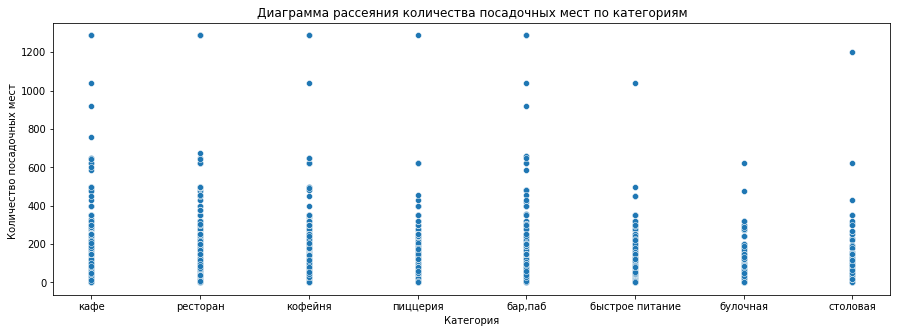

In [11]:
plt.figure(figsize=(15,5))
sns.scatterplot(data=msk_places, x='category', y='seats')
plt.title('Диаграмма рассеяния количества посадочных мест по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество посадочных мест ')
plt.show()

Судя по диаграмме, присутствуют выбросы в более 1200 посадочных мест в заведениях. Будем рассматривать заведения до 400 мест.

In [12]:
seats_count = msk_places.loc[msk_places['seats'] <= 400]
seats_count_median = seats_count.groupby('category').agg({'seats':'median'})
seats_count_median.columns = ['median']
seats_count_median = seats_count_median.reset_index().sort_values(by='median', ascending=False)
fig = px.bar(seats_count_median, 
             x='category', 
             y='median',
             color='category'
            )
fig.update_layout(title='Медианное значения количества посадочных мест для каждой категории',
                   xaxis_title='Категория',
                   yaxis_title='Медианное значения количества посадочных мест')
fig.show() 

В среднем, в ресторанах около 83 мест, в барах и пабах - 80, в кофейнях и столовых - 75, в заведениях обещественного питания - 64, в кафе - 60, в пиццериях - 52, и в булочных - около 50.

Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете.

In [13]:
chain_count = pd.DataFrame(msk_places['chain'].value_counts()).reset_index()
chain_count['index']=chain_count['index'].astype(str)
chain_count.loc[chain_count['index']=='0','index'] = 'несетевые'
chain_count.loc[chain_count['index']=='1','index'] = 'сетевые'
fig = go.Figure(data=[go.Pie(labels=chain_count['index'], 
                             values=chain_count['chain'])])
fig.update_layout(title='Соотношение сетевых и несетевых заведений', 
                  width=800, 
                  height=600)
fig.show() 

Несетевых заведений оказалось больше - 61.9%, сетевых всего 38.1%.

Определим, категории заведений чаще являются сетевыми.

In [14]:
chain_places = msk_places[msk_places['chain'] == 1]
chain_count = chain_places.groupby('category')[['category']].count()
chain_count.columns = ['count']
chain_count = chain_count.reset_index().sort_values(by='count', ascending=False)
fig = px.bar(chain_count, 
             x='category', 
             y='count', 
             color='category')
fig.update_layout(title='Распределение сетевых заведений по категориям',
                   xaxis_title='Категория',
                   yaxis_title='Количество заведений')
fig.show() 

Сетевыми заведениями чаще являются такие категории, как кафе, рестораны и кофейни. Остальные категории гораздо реже являются сетевыми. 

In [15]:
no_chain_places = msk_places[msk_places['chain'] == 0]
no_chain_count = no_chain_places.groupby('category')[['category']].count()
no_chain_count.columns = ['count']
no_chain_count = no_chain_count.reset_index().sort_values(by='count', ascending=False)

In [16]:
result = pd.merge(chain_count, no_chain_count, on=["category"])
result

,category,count_x,count_y
0,кафе,779,1599
1,ресторан,730,1313
2,кофейня,720,693
3,пиццерия,330,303
4,быстрое питание,232,371
5,"бар,паб",169,596
6,булочная,157,99
7,столовая,88,227


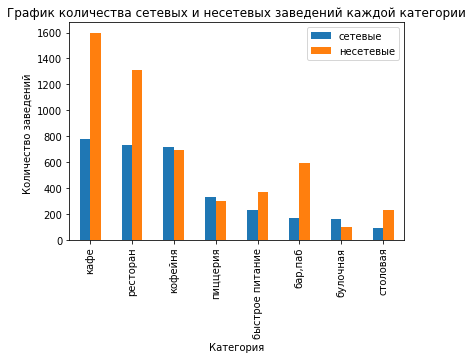

In [17]:
result[['category', 'count_x', 'count_y']].plot(x='category', kind='bar')
plt.legend(['сетевые', 'несетевые'])
plt.title('График количества сетевых и несетевых заведений каждой категории')
plt.xlabel('Категория')
plt.ylabel('Количество заведений ')
plt.show()

Судя по графику сети преобладают только в категориях: кофейни, пиццерии и булочные.

Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Построим подходящую для такой информации визуализацию. 

In [18]:
top15_chain_places = msk_places[msk_places['chain'] == 1]
top15_chain_count = top15_chain_places.groupby(['name', 'category']).agg({'name':'count'})
top15_chain_count.columns = ['count']
top15_chain_count = top15_chain_count.reset_index().sort_values(by='count', ascending=False)[0:15]
display(top15_chain_count)

,name,category,count
1124,шоколадница,кофейня,119
496,домино'с пицца,пиццерия,76
489,додо пицца,пиццерия,74
1140,яндекс лавка,ресторан,72
205,one price coffee,кофейня,71
72,cofix,кофейня,65
241,prime,ресторан,49
617,кофепорт,кофейня,42
632,кулинарная лавка братьев караваевых,кафе,39
963,теремок,ресторан,36


In [19]:
fig = px.bar(top15_chain_count, 
             x='name', 
             y='count', 
             color='name')
fig.update_layout(title='Топ-15 сетевых заведений и их количество в сети в Москве',
                   xaxis_title='Название',
                   yaxis_title='Количество заведений в сети')
fig.show() 

Самой крупной сетью заведений является кофейня "Шоколадница" - целых 119 заведений сети в регионе. Так же достаточно много заведений у сетей "Домино'с Пицца", "Додо Пицца", "One Price Coffee", "Яндекс Лавка" и "Cofix". 

In [20]:
top15_category = top15_chain_count.groupby('category', as_index=False).agg(count=('name','count'))
top15_category['ratio']=top15_category['count']/top15_category['count'].sum()

In [21]:
fig = go.Figure(data=[go.Pie(labels=top15_category['category'], 
                             values=top15_category['ratio'])]) 
                             
fig.update_layout(title='Доли категорий сетевых заведений', 
                  width=800, 
                  height=600)
fig.show() 

Большинство крупных сетевых заведений - это кофейни, в два раза меньше кафе и ресторанов. И еще меньше пиццерий и булочных.

Посмотрим, какие административные районы Москвы присутствуют в датасете. Отобразим общее количество заведений и количество заведений каждой категории по районам.

In [22]:
district = msk_places['district'].unique()
districts = ", ".join(district)
print('В датасете присутствуют следующие административные районы:', districts)

В датасете присутствуют следующие административные районы: Северный административный округ, Северо-Восточный административный округ, Северо-Западный административный округ, Западный административный округ, Центральный административный округ, Восточный административный округ, Юго-Восточный административный округ, Южный административный округ, Юго-Западный административный округ


In [23]:
category_district =  msk_places.groupby(['district','category']).agg({'category':'count'})
category_district.columns = ['count']
category_district = category_district.reset_index()

In [24]:
fig = px.bar(category_district, 
             x='count', 
             y='district',
             color='category')
            
fig.update_layout(title='Распределение заведений в разрезе категорий по округам',
                   xaxis_title='Доли категорий',
                   yaxis_title='Район')
fig.show() 

Подавляющая часть заведений находится в Центральном административном округе; там преобладают такие категории заведений, как рестораны, кафе, кофейни, бары и пабы. Меньше всего заведений в Северо-западном административном округе. Так же можно отметить, что во всех районах, кафе гораздо больше, чем остальных категорий заведений.

Визуализируем распределение средних рейтингов по категориям заведений. 

In [25]:
rating_category = msk_places.groupby('category', as_index=False)['rating'].agg('mean').sort_values(by='rating', ascending=False)
display(rating_category)

,category,rating
0,"бар,паб",4.387712
5,пиццерия,4.301264
6,ресторан,4.290357
4,кофейня,4.277282
1,булочная,4.268359
7,столовая,4.211429
3,кафе,4.123886
2,быстрое питание,4.050249


In [26]:
fig = px.bar(rating_category, 
             x='category', 
             y='rating',
             color='category')
            
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                   xaxis_title='Средние рейтинги',
                   yaxis_title='Категория')
fig.show() 

Усредненные рейтинги у разных типов общепита не очень сильно различаются. Можно заметить, что самые высокие рейтинги у баров и пабов, а самые низкие у заведений быстрого питания.

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [27]:
rating_district = msk_places.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by='rating', ascending=False)
display(rating_district)

,district,rating
5,Центральный административный округ,4.377520
2,Северный административный округ,4.239778
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184417
1,Западный административный округ,4.181551
0,Восточный административный округ,4.174185
7,Юго-Западный административный округ,4.172920
3,Северо-Восточный административный округ,4.148260
6,Юго-Восточный административный округ,4.101120


In [28]:
# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самые высокие рейтинги у заведений в Центральном административном округе, а самые низкие у заведений в Юго-Восточном административном округе. Возможно следует открыть хорошее заведение в Юго-Восточном округе.

Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [29]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
msk_places.apply(create_clusters, axis=1)

# выводим карту
m

Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам.

In [30]:
top15_street = msk_places.groupby('street').agg({'name':'count'})
top15_street.columns = ['count']
top15_street = top15_street.reset_index().sort_values(by='count', ascending=False)[0:15]
display(top15_street)

,street,count
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


In [31]:
list_top15_name = top15_street['street'].unique()
top15_street_category =  msk_places.groupby(['street','category']).agg({'category':'count'})
top15_street_category.columns = ['count']
top15_street_category = top15_street_category.query('street in @list_top15_name')
top15_street_category = top15_street_category.reset_index()

In [32]:
fig = px.bar(top15_street_category, 
             x='count', 
             y='street',
             color='category')
            
fig.update_layout(title='Распределение заведений в разрезе категорий по улицам',
                   xaxis_title='Доли категорий',
                   yaxis_title='Улица')
fig.show() 

Подавляющая часть заведений находится на улице проспект Мира; там преобладают такие категории заведений, как кафе, рестораны и  кофейни. Так же достаточно много заведений на Профсоюзной улице, Ленинградском проспекте и проспекте Вернандского. Можно отметить, что почти на всех улицах преобладают кафе и рестораны.

Найдем улицы, на которых находится только один объект общепита. 

In [33]:
top_street = msk_places.groupby('street').agg({'name':'count'})
top_street.columns = ['count']
one_name_street = top_street.query('count==1').reset_index()
display(one_name_street)

,street,count
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
4,1-й Голутвинский переулок,1
...,...,...
451,улица Чечулина,1
452,улица Чистова,1
453,улица Шухова,1
454,улица Юннатов,1


Есть целых 456 улиц, на которых находится один объект общепита.

In [34]:
list_one_street = one_name_street['street'].unique()
category_one_street = msk_places.reindex(columns = ['street','category'])
category_one_street = category_one_street.query('street in @list_one_street')
category_one_street = category_one_street.groupby('category', as_index=False).agg(count=('street','count'))
category_one_street['ratio']=category_one_street['count']/category_one_street['count'].sum()
fig = go.Figure(data=[go.Pie(labels=category_one_street['category'], 
                             values=category_one_street['ratio'])]) 
                             
fig.update_layout(title='Доли категорий заведений', 
                  width=800, 
                  height=600)
fig.show()

Большинство категорий заведений, которые на улице находятся одни - кафе, так же немало ресторанов и кофеен.

In [35]:
rating_one_street = msk_places.query('street in @list_one_street')
rating_one_street = rating_one_street.groupby('category', as_index=False)['rating'].agg('mean').sort_values(by='rating', ascending=False)

In [36]:
fig = px.bar(rating_one_street, 
             x='category', 
             y='rating',
             color='category')
            
fig.update_layout(title='Распределение средних рейтингов по категориям заведений, на улицах содержащих один объект общепита',
                   xaxis_title='Средние рейтинги',
                   yaxis_title='Категория')
fig.show() 

Усредненные рейтинги у разных типов общепита не очень сильно различаются. В целом, рейтинги достаточно высокие, возможно из-за того, что на данных улицах больше нет других альтернатив заведений.

In [37]:
one_street = msk_places.query('street in @list_one_street')
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
    
one_street.apply(create_clusters, axis=1)

m

In [38]:
one_street[one_street['district'] == 'Юго-Восточный административный округ']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
4475,1901 comfort food zone,кафе,"Москва, Самокатная улица, 4, стр. 11",Юго-Восточный административный округ,"ежедневно, 10:00–23:00",55.757106,37.675792,4.3,NaN,NaN,NaN,NaN,0,NaN,Самокатная улица,False
4743,телиани,кафе,"Москва, улица Лефортовский Вал, 11",Юго-Восточный административный округ,"ежедневно, 12:00–00:00",55.758286,37.700594,4.3,средние,Средний счёт:1000 ₽,1000.0,NaN,0,NaN,улица Лефортовский Вал,False
4784,ланч и кофе,кофейня,"Москва, Таможенный проезд, 6, стр. 9",Юго-Восточный административный округ,пн-сб 08:00–20:00,55.751592,37.679505,4.3,средние,Средний счёт:200–400 ₽,300.0,NaN,0,NaN,Таможенный проезд,False
5199,глинтвейн,"бар,паб","Москва, Михайловский проезд, 1, стр. 1",Юго-Восточный административный округ,"ежедневно, 10:00–23:00",55.731687,37.686906,4.1,выше среднего,Средний счёт:1500 ₽,1500.0,NaN,0,NaN,Михайловский проезд,False
5266,кафе,столовая,"Москва, Скотопрогонная улица, 29/1",Юго-Восточный административный округ,"пн-пт 09:00–18:00; сб,вс 12:00–18:00",55.730494,37.695320,3.9,средние,Средний счёт:260 ₽,260.0,NaN,0,NaN,Скотопрогонная улица,False
5348,дрова и угли,кофейня,"Москва, 2-я Карачаровская улица, 1, стр. 1",Юго-Восточный административный округ,"пн-пт 08:00–23:00; сб,вс 10:00–22:00",55.734535,37.752627,4.7,NaN,NaN,NaN,NaN,0,40.0,2-я Карачаровская улица,False
5355,столовая,столовая,"Москва, 2-я Фрезерная улица, 14, стр. 1Г",Юго-Восточный административный округ,пн-чт 08:00–18:00; пт 08:00–17:00,55.740020,37.745030,4.9,NaN,NaN,NaN,NaN,0,NaN,2-я Фрезерная улица,False
5369,роза ветров,"бар,паб","Москва, Сторожевая улица, 4, стр. 8",Юго-Восточный административный округ,"пн-чт 10:00–22:00; пт 10:00–23:40; сб,вс 11:00...",55.765968,37.709705,4.4,средние,Средний счёт:600–800 ₽,700.0,NaN,0,NaN,Сторожевая улица,False
5412,зарайский дворик,"бар,паб","Москва, Зарайская улица, 33, корп. 2",Юго-Восточный административный округ,пн-чт 12:00–00:00; пт-вс 12:00–02:00,55.729846,37.770644,4.1,NaN,NaN,NaN,NaN,0,44.0,Зарайская улица,False
5513,магазин кафе,кафе,"Москва, 4-я Кабельная улица, 2, стр. 1",Юго-Восточный административный округ,"ежедневно, 09:00–17:00",55.741316,37.717584,4.2,NaN,NaN,NaN,NaN,0,180.0,4-я Кабельная улица,False


В Юго-Восточном округе, например, можно открыть заведения на улицах: Старые Кузьминки (рейтинг у единственного заведения на улице всего 2.9), Стахановская улица (рейтинг 2.6), Курьяновская улица (рейтинг 2.7),  2-й квартал Капотни (рейтинг 2.8).

Посчитаем медиану столбца со средними чеками для каждого района. Будем использовать это значение в качестве ценового индикатора района. 

In [39]:
middle_avg_bill = msk_places.groupby('district', as_index=False)['middle_avg_bill'].agg('median').sort_values(by='middle_avg_bill', ascending=False)
display(middle_avg_bill)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


Построим фоновую картограмму с полученными значениями для каждого района. Проанализируем цены в центральном административном округе и других. 

In [40]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m)

m

Самые высокие цены в заведениях, находящихся в Западном административном округе и Центральном административном округе. Во всех остальных районах цены значительно ниже. Чем дальше район от центра, тем ниже цены; только в западном районе цены такие же высокие. И в целом, в направлении северо-запада цены выше, чем в других районах.

Исследуем особенности заведений с плохими рейтингами(примем его <3), средние чеки в таких местах и распределение по категориям заведений.

In [41]:
bad_rating_places = msk_places[msk_places['rating'] < 3]
bad_rating = bad_rating_places.groupby('category')[['category']].count()
bad_rating.columns = ['count']
bad_rating = bad_rating.reset_index().sort_values(by='count', ascending=False)
display(bad_rating)

,category,count
3,кафе,107
6,ресторан,32
2,быстрое питание,31
4,кофейня,16
0,"бар,паб",8
5,пиццерия,8
7,столовая,6
1,булочная,2


In [42]:
fig = px.bar(bad_rating, 
             x='category', 
             y='count', 
             color='category')
fig.update_layout(title='Распределение заведений с плохим рейтингом по категориям',
                   xaxis_title='Категория',
                   yaxis_title='Количество заведений')
fig.show() 

Подавляющее число заведений с плохим рейтингом - это кафе (целых 107 заведений из 210 с плохим рейтингом). Возможно следует открыть именно хорошее кафе.

# Выводы:

1. В Москве среди заведений общественного питания больше всего кафе, так же много ресторанов, и немало коффен. Гораздо меньше баров, пиццерий, заведений быстрого питания, столовых и булочных.
2. В среднем, в ресторанах около 83 мест, в барах и пабах - 80, в кофейнях и столовых - 75, в заведениях обещественного питания - 64, в кафе - 60, в пиццериях - 52, и в булочных - около 50.
3. Несетевых заведений оказалось больше - 61.9%, сетевых всего 38.1%.
4. Сетевыми заведениями чаще являются такие категории, как кафе, рестораны и кофейни. Остальные категории гораздо реже являются сетевыми. Сети преобладают только в категориях: кофейни, пиццерии и булочные.
5. Самой крупной сетью заведений является кофейня "Шоколадница" - целых 119 заведений сети в регионе. Так же достаточно много заведений у сетей "Домино'с Пицца", "Додо Пицца", "One Price Coffee", "Яндекс Лавка" и "Cofix".
6. Большинство крупных сетевых заведений - это кофейни, в два раза меньше кафе и ресторанов. И еще меньше пиццерий и булочных.
7. Подавляющая часть заведений находится в Центральном административном округе; там преобладают такие категории заведений, как рестораны, кафе, кофейни, бары и пабы. Меньше всего заведений в Северо-западном административном округе. Так же можно отметить, что во всех районах, кафе гораздо больше, чем остальных категорий заведений.
8. Усредненные рейтинги у разных типов общепита не очень сильно различаются. Можно заметить, что самые высокие рейтинги у баров и пабов, а самые низкие у заведений быстрого питания.
9. Самые высокие рейтинги у заведений в Центральном административном округе, а самые низкие у заведений в Юго-Восточном административном округе. Возможно следует открыть хорошее заведение в Юго-Восточном округе.
10. Подавляющая часть заведений находится на улице проспект Мира; там преобладают такие категории заведений, как кафе, рестораны и кофейни. Так же достаточно много заведений на Профсоюзной улице, Ленинградском проспекте и проспекте Вернандского. Можно отметить, что почти на всех улицах преобладают кафе и рестораны.
11. Есть целых 456 улиц, на которых находится один объект общепита.
12. Большинство категорий заведений, которые на улице находятся одни - кафе, так же немало ресторанов и кофеен.
13. Усредненные рейтинги у разных типов общепита не очень сильно различаются. В целом, рейтинги достаточно высокие, возможно из-за того, что на данных улицах больше нет других альтернатив заведений.
14. Самые высокие цены в заведениях, находящихся в Западном административном округе и Центральном административном округе. Во всех остальных районах цены значительно ниже. Чем дальше район от центра, тем ниже цены; только в западном районе цены такие же высокие. И в целом, в направлении северо-запада цены выше, чем в других районах.
15. Подавляющее число заведений с плохим рейтингом - это кафе (целых 107 заведений из 210 с плохим рейтингом). Возможно следует открыть именно хорошее кафе.

Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [43]:
coffee_places_all = msk_places[msk_places['category'] == 'кофейня']
print('Всего кофеен в датасете: ', coffee_places_all['name'].count())

Всего кофеен в датасете:  1413


In [44]:
coffee_places = coffee_places_all.groupby('district').agg({'name':'count'})
coffee_places.columns = ['count']
coffee_places = coffee_places.reset_index().sort_values(by='count', ascending=False)
display(coffee_places)

,district,count
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [45]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=coffee_places,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Кофейни',
).add_to(m)

m

Самое большое количество кофеен - в Центральном административном округе. В остальных районах кофеен гораздо меньше.

Есть ли круглосуточные кофейни?

In [46]:
print(coffee_places_all['name'][coffee_places_all['is_24/7'] == True].count())

59


Целых 59 кофеен работают круглосуточно.

Какие у кофеен рейтинги? Как они распределяются по районам?

In [47]:
rating_coffee = coffee_places_all.groupby('district', as_index=False)['rating'].agg('median').sort_values(by='rating', ascending=False)
rating_coffee

,district,rating
0,Восточный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
1,Западный административный округ,4.2


In [48]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=rating_coffee,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Средние рейтинги кофеен',
).add_to(m)

m

У кофеен в среднем одинаковые рейтинги, только у Западного административного округа чуть ниже.

На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [49]:
print('Среднее значение цен на чашку капучино:', coffee_places_all['middle_coffee_cup'].mean())
print('Медианное значение цен на чашку капучино:', coffee_places_all['middle_coffee_cup'].median())

Среднее значение цен на чашку капучино: 175.0556621880998
Медианное значение цен на чашку капучино: 170.0


При открытии следует ориентироваться на стоимость чашки капучино в 170 рублей, так как среднее и медианное значение в заведениях около 170 рублей. Возможно сначала даже сделать цену ниже (150-160 рублей), а когда уже заведение станет популярнее, увеличивать цену.

На сколько посадочных мест следует ориентироваться при открытии?

In [50]:
print('Среднее значение количества посадочных мест:', coffee_places_all['seats'].mean())
print('Медианное значение количества посадочных мест:', coffee_places_all['seats'].median())

Среднее значение количества посадочных мест: 111.19973368841545
Медианное значение количества посадочных мест: 80.0


Количество посадачных мест можно сделать около 70-80.

# Вывод

Я считаю, что лучшим решением будет открытие кофейни на территории какого-либо университета, так как у студентов кофейни всегда пользуются спросом. Необходимо только определить, в каком университете будет меньше конкуренции.  Судя по информации из датасета, на территории МГУ, МИФИ, МГТУ им. Баумана нет кофеен.

Часы и дни работы кофеен можно установить с часами и днями работы университета (например, пн-пт, с 8:00 до 18:00).
Цены лучше установить немного меньше среднего по Москве (на чашку капучино), так как потенциальными посетителями будут студенты (150-160 рублей). Количество посадочных мест можно сделать около 70-80.

Презентация: https://drive.google.com/file/d/1leCYjP-fcj3NRnBEID2T_fmAGjqbkaDk/view?usp=sharing